# Proyecto "*Determinación de especies según distribución geográfica*"
Integrantes:
- Luis Arrieta Arrieta
- Stefany Solano González

# Descripción
Este proyecto nace para evidenciar la falta de sistematización de biodiversidad que existe y cómo a pesar de que Costa Rica posee aproximadamente un 8% de la riqueza natural, esta no se visibiliza en bases de datos internacionales. Adicionalmente, en este trabajo queremos explorar los registros existentes en la base de datos del Catálogo de la vida, haciendo un pequeño énfasis en el grupo taxonómico Fungi. Como justificación de este proyecto, el Sistema Global de Información sobre Biodiversidad (GBIF por sus siglas en inglés) funge como una red internacional e infraestructura de datos financiada por los gobiernos del mundo para dar a cualquiera, en cualquier lugar, acceso abierto a datos sobre todas las formas de vida en la Tierra; no obstante la cuota de participacion en el depósito de estos datos evidencia otros rasgos como la participación científica de paises en estas redes. **Como justificación de este proyecto**, queremos explorar la distribución de los datos y ver si la cuota de participación en el deposito de estos en el Sistema Global de Información sobre Biodiversidad (GBIF por sus siglas en inglés) tiene una lata representación de países diversos, como Costa Rica ó si se encuentra dominada por algún otro factor, potencialmente relacionado a  variables como financiamiento, poder adquisitivo, PIB invertido en ciencia, desarrollo científico etc.

# Antecedentes
El conocimiento de la biodiversidad en el planeta es esencial para su aprovechamiento y protección. Entender el nicho, biología y potencial de grupos taxonómicos ha permitido que la sociedad desarrolle a partir de estos elementos de gran impacto y utilidad; con aplicación antibiótica, antiinflamatoria, biosintética, antihistamínica entre muchas otras (Pacyga et al. 2024). No obstante, existen grupos taxonómicos como los hongos (Blis & Gloer 2016) o bien ambientes de estudio donde el desconocimiento es elevado como en el caso de especies marinas (Rogers et al. 2022). Adicionalmente, en un inicio los registros de la biodiversidad eran manuales y poco personal tenia acceso a los mismos (Folk & Siniscalchi 2021) ya que se encontraban unificados en museos de paises desarrollados; sin embargo, el avance de la ciencia en sus múltiples dimensiones ha brindado un acceso masivo a la información y generación de datos; no obstante la sistematización de esta sigue siendo compleja (Kirk 2023, Alexander et al. 2024) y dificil de integrar. Aunado a esta complejidad se suma la poca participación o inclusión de países latinoamericanos con altos índices de biodiversidad, lo que dificulta visilibilizar el valor que natural que reside en estos y consecuentemente complica la implementación de politicas de protección, mitigación etc.  

# Descripción del problema y objetivo

Existe un catálogo de la vida, que unifica a todas las especies conocidas a la fecha (última actualización 26 de marzo/2024) y dada la relevancia internacional de Costa Rica como albergue del 8% de biodiversidad mundial deseamos evidenciar la cuota de participación Costarricense en este catálogo. Adicionalmente, el grupo taxonómico de los hongos es uno de los menos conocidos, explorados y categorizados, por lo que también enfocaremos nuestro estudio a este grupo con el fin de corroborar si efectivamente existe un desconocimiento real. Por lo tanto, **nuestro objetivo** consiste en explorar la distribución de organismos según región geográfica/país y conocer la participación costarricense y latinoamericana en estos registros; así como evidenciar el actual conocimiento existente en grupos taxonómicos específicos como el fúngico.  

# Instalación e importación de Bibliotecas

In [ ]:
#instalación de librerias
!pip install numpy
!pip install pandas
!pip install seaborn
!pip install scikit-learn
!pip install matplotlib
!pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 13.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 14.4 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=3ace8b4184c43941afd24668cb54735e54d61b82ef80144079012c4673086b9c
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
#Librería para indices de diversidad
pip install scikit-bio


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 12.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 41.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-bio: filename=scikit_bio-0.6.0-cp310-cp310-linux_x86_64.whl size=2978855 sha256=68d602a6855ddc862eae379a52c02a23fb1421ac70f3846bcd866229e4dd466b
  Stored in directory: /root/.cache/pip/wheels/44/54/d7/d48067a8b538ad5e67e28c956204e2e564edd7ae5017d9252e
  Created wheel for hdmedians: filename=hdmedians-0.14.2-cp310-cp310-linux_x86_64.whl size=677344 sha256=9b0fea9a

In [ ]:
#importar librerias
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from ydata_profiling import ProfileReport

import matplotlib.pyplot as plt
%matplotlib inline

# Importar set de Datos
Obtenidos del link: https://www.gbif.org/es/dataset/7ddf754f-d193-4cc9-b351-99906754a03b

Este conjunto de datos contiene 4 dataframes que recopilan datos sobre el catálogo de organismos de todas las especies conocidas en la tierra a la fecha. Este catálogo incluye especies extintas como vigentes y se cree que cubre por lo menos el 80% de las especies conocidas.

Las tablas de datos corresponden a
- Distribución
- Especies reportadas
- Taxones reportados
- Nombres vernaculares (autóctonos de cada región) para las especies indicadas

*Cabe destacar que toda la información es en idioma inglés*

Cita de los datos: Bánki, O., Roskov, Y., Döring, M., Ower, G., Hernández Robles, D. R., Plata Corredor, C. A., Stjernegaard Jeppesen, T., Örn, A., Vandepitte, L., Hobern, D., Schalk, P., DeWalt, R. E., Ma, K., Miller, J., Orrell, T., Aalbu, R., Abbott, J., Adlard, R., Aedo, C., et al. (2024). Catalogue of Life Checklist (Version 2024-03-26). Catalogue of Life. https://doi.org/10.48580/dfz8d

In [ ]:
#Cargar cada uno de los dataframes utilizando pandas
distribution = pd.read_csv('Distribution.tsv', sep='\t')
species = pd.read_csv('SpeciesProfile.tsv', sep='\t')
taxon = pd.read_csv('Taxon.tsv', sep='\t')

#Modificar encabezado de df para que sea más entendible [se elimina caracteres 'dwc']
distribution = distribution.rename(columns=lambda x: x.replace('dwc:',''))
species = species.rename(columns=lambda x: x.replace('dwc:',''))
taxon = taxon.rename(columns=lambda x: x.replace('dwc:',''))

<ipython-input-4-f448e452311d>:4: DtypeWarning: Columns (16) have mixed types. Specify dtype option on import or set low_memory=False.
  taxon = pd.read_csv('Taxon.tsv', sep='\t')


In [ ]:
#Explorar tamaño de archivos con shape
print("distribution.shape:", distribution.shape)
print("species.shape:", species.shape)
print("taxon.shape:", taxon.shape)

distribution.shape: (104015, 6)
species.shape: (473602, 5)
taxon.shape: (31349, 22)


# Análisis exploratorio

In [ ]:
distribution#Ver el dataframe

,taxonID,occurrenceStatus,locationID,locality,countryCode,dcterms:source
0,6L823,native,NaN,Ecuador; Peru,NaN,NaN
1,T5NN,native,NaN,Panama,NaN,NaN
2,7FVWC,native,mrgid:1912,NaN,NaN,NaN
3,7FVWC,native,mrgid:8402,NaN,NaN,"Ax, P., & Sopott-Ehlers, B. (1987). Otoplanida..."
4,3WT95,native,tdwg:SUM,NaN,NaN,"Group, S.F. (2023) SF specimen locality data f..."
...,...,...,...,...,...,...
104010,6L7TZ,native,tdwg:PAN,NaN,NaN,NaN
104011,6L7TZ,native,tdwg:PER,NaN,NaN,NaN
104012,6L7TZ,native,tdwg:VEN,NaN,NaN,NaN
104013,6BNZY,native,NaN,Congo,NaN,NaN


In [ ]:
df['locality'].unique()#Ver datos de la variable

array(['Ecuador; Peru', 'Panama', nan, ...,
       'Europe (AU BE BH CZ DE FI FR GB GE GR HU IT NL NR PL RO SK SL SP SV SZ UK), Russia (n+s European)',
       'NE USA; USA: Indiana; USA: New York; USA: West Virginia',
       'China (Guizhou, Zhejiang)'], dtype=object)

In [ ]:
species#ver data frame

,taxonID,gbif:isExtinct,gbif:isMarine,gbif:isFreshwater,gbif:isTerrestrial
0,8XRM,False,False,False,True
1,6D3DF,NaN,True,False,False
2,49V84,NaN,True,False,False
3,BYZP2,True,NaN,NaN,NaN
4,3JK6Z,False,False,False,True
...,...,...,...,...,...
473597,9QLSL,false,NaN,NaN,NaN
473598,BJBQ4,false,NaN,NaN,NaN
473599,6YNKM,false,NaN,NaN,NaN
473600,6KDRH,false,False,False,True


In [ ]:
taxon

,taxonID,parentNameUsageID,acceptedNameUsageID,originalNameUsageID,scientificNameID,datasetID,taxonomicStatus,taxonRank,scientificName,scientificNameAuthorship,...,infragenericEpithet,specificEpithet,infraspecificEpithet,cultivarEpithet,nameAccordingTo,namePublishedIn,nomenclaturalCode,nomenclaturalStatus,taxonRemarks,dcterms:references
0,9FSLC,92BPW,NaN,NaN,---3nn39ZQdkDGBvoaGdR2,55434.0,accepted,species,"Homaloxestis australis Park, 2004","Park, 2004",...,NaN,australis,NaN,NaN,NaN,"Park, K.-T. (2004) Genus Homaloxestis Meyrick ...",ICZN,nomen legitimum,NaN,NaN
1,8XRM,8NLB3,NaN,NaN,---6f-YWvlv8BS-R6m-8Y,1050.0,accepted,species,"Acanthograeffea modesta Günther, 1932","Günther, 1932",...,NaN,modesta,NaN,NaN,NaN,"Günther, K. (1932) Beiträge zur Systematik und...",ICZN,nomen legitimum,NaN,NaN
2,6D3DF,7NWBC,NaN,NaN,---9Qo8j1JQR04niBsWYb0,1191.0,accepted,species,"Diarthrodes gravellicola Soyer, 1975","Soyer, 1975",...,NaN,gravellicola,NaN,NaN,NaN,"Soyer, J. (1975). Contribution a l’étude des C...",ICZN,nomen validum,NaN,https://www.marinespecies.org/copepoda/aphia.p...
3,47BF5,63SP,NaN,NaN,---BEZLG8WfmCKzOoARWg1,1141.0,accepted,species,Neurotheca congolana De Wild. & T. Durand,De Wild. & T. Durand,...,NaN,congolana,NaN,NaN,NaN,De Wild. & T. Durand. (1899). In: Compt. Rend....,ICN,NaN,NaN,http://www.worldplants.de/?deeplink=Neurotheca...
4,5BVQY,87PB,NaN,NaN,---D7syAmBAb7tLYVFT3L2,1141.0,accepted,species,Weberbauerocereus cephalomacrostibas (Werderm....,(Werderm. & Backeb.) F. Ritter,...,NaN,cephalomacrostibas,NaN,NaN,NaN,"Ritter, F. (1981). In: Kakteen Südamer. 4: 1353.",ICN,NaN,NaN,http://www.worldplants.de/?deeplink=Weberbauer...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31344,BTY38,BTWH2,NaN,NaN,-W4y6bo2Lksp9tq-VpszI,2299.0,accepted,suborder,"Orthotetidina Waagen, 1884","Waagen, 1884",...,NaN,NaN,NaN,NaN,NaN,"Waagen, W. H. (1884). Productus Limestone Foss...",ICZN,nomen validum,NaN,https://www.marinespecies.org/aphia.php?p=taxd...
31345,7CZ6W,83V5,NaN,NaN,-W519nFjr9suClYRetk6q2,1141.0,accepted,species,Turnera dasytricha Pilg.,Pilg.,...,NaN,dasytricha,NaN,NaN,NaN,Pilg. (1902). In: Bot. Jahrb. Syst. 30: 176.,ICN,NaN,NaN,http://www.worldplants.de/?deeplink=Turnera-da...
31346,6W2JF,6SBV,NaN,NaN,-W56CNeiw5dk2Su0z29DX2,1027.0,accepted,species,"Plectris luctuosa Frey, 1967","Frey, 1967",...,NaN,luctuosa,NaN,NaN,NaN,"Frey, G. (1967). Die Gattung Plectris (Philoch...",ICZN,NaN,NaN,NaN
31347,9YKMW,NaN,3R6S7,NaN,-W5K30rzgvcP9lNsPt33i0,1011.0,synonym,species,"Seliza bisecta Kirby, 1891","Kirby, 1891",...,NaN,bisecta,NaN,NaN,NaN,NaN,ICZN,NaN,NaN,NaN


In [ ]:
# Obtener los taxones con variables en común
common_taxonIDs = set(distribution['taxonID']).intersection(species['taxonID']).intersection(taxon['taxonID'])

print(common_taxonIDs)


{'6RBK4', 'D5ZP', '7CTDT', '7RZW5', '72P8R', 'BP7FL', '86986', '8GWQF', '8G3C5', 'GVSX', '676MZ', '6WHSF', '3DVL6', '3KVG8', '6P75C', '524CV', '9GFZD', '9BWKL', '4KQQW', '532JC', '86JNS', '5L38J', '86S4B', '9BCPC', '5FPVK', '552PQ', '7ZLYJ', '46LW8', '9F568', '8QJLB', 'LJ2C', '7BFPS', '6TSHS', '6HWHQ', '8P8WT', 'BN3LN', '4HYYF', '5KW94', '9YQM', 'PWD5', '4B8GS', '86FMH', '85YY4', '555YN', '7XMSR', '699HV', '4MLC6', '6RHNT', '47FD6', '7SX8S', '4QTDQ', '64SQ4', '7JZPT', 'JR22', '39YWT', '9J5CP', '559WJ', '8P9YT', '3H55S', '4BQMW', '4V63V', '4GD5Q', '3TQMR', '7DF9C', '7ZPML', '74KSW', '4PCM4', '64ZXD', '4WXCC', 'JWWP', '3QPR3', '6TWPK', 'D58M', '3GD7V', 'C4WM4', '8TDY9', '4MVL7', '3CGQK', '64VN3', '33HGB', '5X5GN', '3P6VT', '6KWGY', '5TX57', 'WK2C', '4KS6F', '4WWMQ', '7ZBLC', '4DJ6G', 'H66D', '79HGH', '3S468', '894CG', 'RVYX', 'B43VH', '3HDR7', '854PQ', '56V4T', 'CQ5G', 'B75BM', '7F8TJ', '46TDG', '93KL8', '6MMCC', '4VZMP', 'B7623', 'NC39', '3LGQD', '6BGKN', '67YTD', '6M566', '3L7YN', '69K

In [ ]:
#Unir los 3 dataframe por la columna taxonID, manteniendo las filas que no hacen match
df = distribution.merge(species, on='taxonID', how='outer').merge(taxon, on='taxonID', how='outer')
df

,taxonID,occurrenceStatus,locationID,locality,countryCode,dcterms:source,gbif:isExtinct,gbif:isMarine,gbif:isFreshwater,gbif:isTerrestrial,...,infragenericEpithet,specificEpithet,infraspecificEpithet,cultivarEpithet,nameAccordingTo,namePublishedIn,nomenclaturalCode,nomenclaturalStatus,taxonRemarks,dcterms:references
0,6L823,native,NaN,Ecuador; Peru,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,T5NN,native,NaN,Panama,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,7FVWC,native,mrgid:1912,NaN,NaN,NaN,NaN,True,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,7FVWC,native,mrgid:8402,NaN,NaN,"Ax, P., & Sopott-Ehlers, B. (1987). Otoplanida...",NaN,True,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3WT95,native,tdwg:SUM,NaN,NaN,"Group, S.F. (2023) SF specimen locality data f...",False,False,False,True,...,NaN,luctuosa,NaN,NaN,NaN,"Brunner von Wattenwyl, C. (1888) Monographie d...",ICZN,nomen legitimum,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3115289,7KXQ3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,longa,parviflora,NaN,NaN,"Maire, & Weiller. (1961). In: Fl. Afrique N. 7...",ICN,NaN,NaN,NaN
3115290,76H4K,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,sphaerica,NaN,NaN,NaN,"H. Schaef., S. S. Renner. (2011). In: Taxon 60...",ICN,NaN,NaN,http://www.worldplants.de/?deeplink=Penelopeia...
3115291,76MKV,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,nigella,NaN,NaN,NaN,Cuatrec. (1981). In: Phytologia 49(3): 248.,ICN,NaN,NaN,NaN
3115292,3NNXQ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,acuta,NaN,NaN,NaN,NaN,ICZN,nomen legitimum,NaN,NaN


In [ ]:
#Explorar columnas de cada df individualmente
print("distribution.shape:", distribution.columns)
print("species.shape:", species.columns)
print("taxon.shape:", taxon.columns)

distribution.shape: Index(['taxonID', 'occurrenceStatus', 'locationID', 'locality', 'countryCode',
       'dcterms:source'],
      dtype='object')
species.shape: Index(['taxonID', 'gbif:isExtinct', 'gbif:isMarine', 'gbif:isFreshwater',
       'gbif:isTerrestrial'],
      dtype='object')
taxon.shape: Index(['taxonID', 'parentNameUsageID', 'acceptedNameUsageID',
       'originalNameUsageID', 'scientificNameID', 'datasetID',
       'taxonomicStatus', 'taxonRank', 'scientificName',
       'scientificNameAuthorship', 'col:notho', 'genericName',
       'infragenericEpithet', 'specificEpithet', 'infraspecificEpithet',
       'cultivarEpithet', 'nameAccordingTo', 'namePublishedIn',
       'nomenclaturalCode', 'nomenclaturalStatus', 'taxonRemarks',
       'dcterms:references'],
      dtype='object')


In [ ]:
# Generar el informe con pandas-profiling para df SpeciesProfile
df_profile = ProfileReport(df, title="Informe Pandas Profiling - SpeciesProfile Dataset", explorative=True)
df_profile.to_file("species_report.html")


/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df_profile

Según el informe de Pandas para el data frame *Species* (el cuál lista el tipo de especie en cuestión - extinta, marina, terrestre, etc), esta presenta un 30.6% de datos faltantes. Se contabiliza un total de 1,665,788 de registros; de estos el 12.3% se encuentran extintos y de los remanentes la mayoría se clasifican como terrestres ( 47%).


Por otro lado, según el informe de Pandas para el data frame *Distribution* (el cuál detalla las categorías de las especies como nativas, domesticadas, alien y desconocidas; así como la localidad del registro) presenta un 46.2% de datos faltantes. La variable de especies nativas se encuentra altamente desbalanceada pues cerca del 99% están anotadas como nativas.



En cuanto al data frame *Taxon*, de manera exploratoria el informe de Pandas presenta un 43% de datos faltantes. La categoría de clasificación dominante corresponde a especies (75% de los datos), con 33 especies únicas.

In [ ]:
# Retornar el número de valores únicos en cada columna del dataframe
print('Valores únicos para df Distribution', df.nunique(),'\n')

Valores únicos para df Distribution taxonID                     528630
occurrenceStatus                 4
locationID                    2776
locality                      9715
countryCode                    196
dcterms:source                3816
gbif:isExtinct                   5
gbif:isMarine                    2
gbif:isFreshwater                2
gbif:isTerrestrial               2
parentNameUsageID            11880
acceptedNameUsageID          15256
originalNameUsageID           4385
scientificNameID             31349
datasetID                      107
taxonomicStatus                  5
taxonRank                       32
scientificName               31345
scientificNameAuthorship     22855
col:notho                        1
genericName                  17960
infragenericEpithet           1472
specificEpithet              19940
infraspecificEpithet          3314
cultivarEpithet                  0
nameAccordingTo                  1
namePublishedIn              19086
nomenclaturalCode  

Las dataframes para los análisis más detallados corresponden a *Distribution y Taxon*, que serán las que se utilizaran subsecuentemente.

# Gráfico de países con más accesos en Catálogo de la Vida

China: 5064
Brazil: 4145
Indonesia: 3254
South Africa: 2877
United States: 2257
Mexico: 2254
Argentina: 2202
India: 2155
Australia: 2004
Bolivia, Plurinational State of: 1768
Bolivia: 1768
Malaysia: 1736
Congo, the Democratic Republic of the: 1695
Philippines: 1578
Peru: 1479
Papua New Guinea: 1462
Viet Nam: 1422
Vietnam: 1422
Japan: 1331
Madagascar: 1304
Turkey: 1303
Colombia: 1266
Russian Federation: 1257
Russia: 1257
Canada: 1199
Italy: 1152
Lao People's Democratic Republic: 1149
Tanzania, United Republic of: 1145
Chile: 1109
Ecuador: 1104
Costa Rica: 1071
Panama: 1021
Kazakhstan: 1000
Cameroon: 951
Greece: 914
French Guiana: 902
Taiwan: 891
Thailand: 888
Kenya: 849
Guatemala: 828


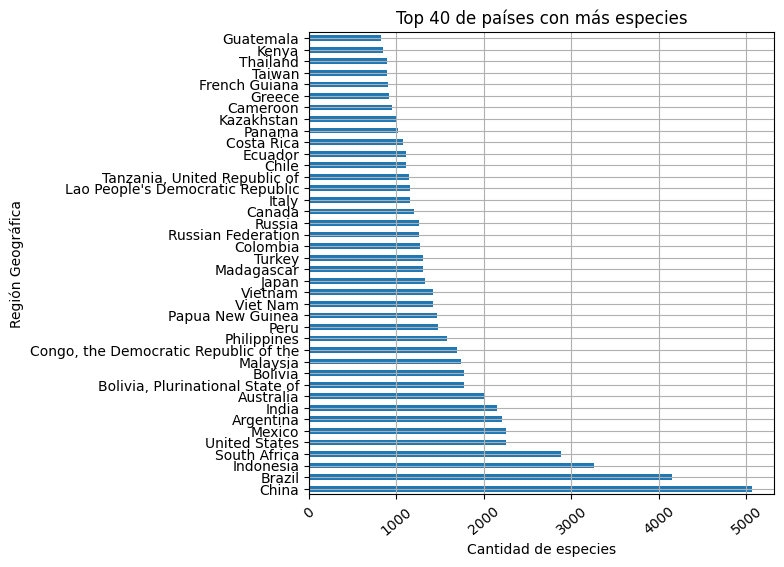

In [ ]:
locality_counts = df_loc['Country'].value_counts()
top40 = locality_counts.head(n=40)
tail4040 = locality_counts.tail(n= 40)

##GRAFICO TOP40
# Tamaño del gráfico
plt.figure(figsize=(6, 6)) #primera "capa de la figura"

# Contar total por país
for value, count in top40.items():
    print(f'{value}: {count}')

# Crear gráfico de barras
#grafico de barra vertical
top40.plot(kind='barh')

# Título del gráfico
plt.title('Top 40 de países con más especies')
# Etiqueta del eje X
plt.xlabel('Cantidad de especies')
# Etiqueta del eje Y
plt.ylabel('Región Geográfica')
# Inclinación de las etiquetas del eje X
#rota el texto
plt.xticks(rotation=40)
plt.grid()
plt.show()

# Gráfico de países con menos accesos en Catálogo de la Vida

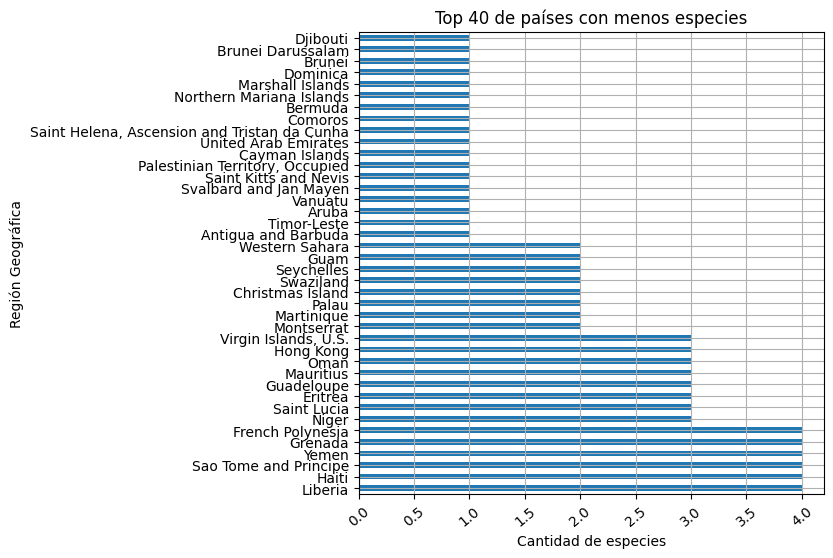

In [ ]:

locality_counts = df_loc['Country'].value_counts()
top40 = locality_counts.head(n=40)
tail40 = locality_counts.tail(n= 40)

#GRAFICO TAIL40
# Tamaño del gráfico
plt.figure(figsize=(6, 6)) #primera "capa de la figura"
# Crear gráfico de barras
#grafico de barra vertical
tail40.plot(kind='barh')

# Título del gráfico
plt.title('Top 40 de países con menos especies')
# Etiqueta del eje X
plt.xlabel('Cantidad de especies')
# Etiqueta del eje Y
plt.ylabel('Región Geográfica')
# Inclinación de las etiquetas del eje X
#rota el texto
plt.xticks(rotation=40)
plt.grid()
plt.show()

In [ ]:
taxon.columns#Ver columnas del dataframe

Index(['taxonID', 'parentNameUsageID', 'acceptedNameUsageID',
       'originalNameUsageID', 'scientificNameID', 'datasetID',
       'taxonomicStatus', 'taxonRank', 'scientificName',
       'scientificNameAuthorship', 'col:notho', 'genericName',
       'infragenericEpithet', 'specificEpithet', 'infraspecificEpithet',
       'cultivarEpithet', 'nameAccordingTo', 'namePublishedIn',
       'nomenclaturalCode', 'nomenclaturalStatus', 'taxonRemarks',
       'dcterms:references'],
      dtype='object')

In [ ]:
taxon_counts = taxon['genericName'].value_counts()#Realizar conteo por genero de individuos
head_taxon40 = taxon_counts.head(n=40)
tail_taxon40 = taxon_counts.tail(n= 40)

head_taxon40

genericName
Hieracium       365
Rubus           218
Astragalus      112
Helix           111
Senecio         103
Rosa             95
Solanum          84
Ranunculus       77
Agaricus         77
Ficus            73
Simulium         70
Zygaena          70
Drosophila       64
Potentilla       63
Viola            63
Tabanus          63
Bryum            62
Piper            62
Unio             62
Eugenia          60
Cortinarius      60
Salix            57
Taraxacum        55
Acacia           55
Peperomia        53
Centaurea        53
Otiorhynchus     53
Polypodium       51
Puccinia         51
Asplenium        51
Andrena          51
Sphagnum         50
Megaselia        50
Conus            50
Lecidea          50
Hypnum           49
Aphis            48
Onthophagus      48
Rhododendron     48
Eupithecia       48
Name: count, dtype: int64

# Gráfico de las especies más comunes globalmente en Dataframe Taxon

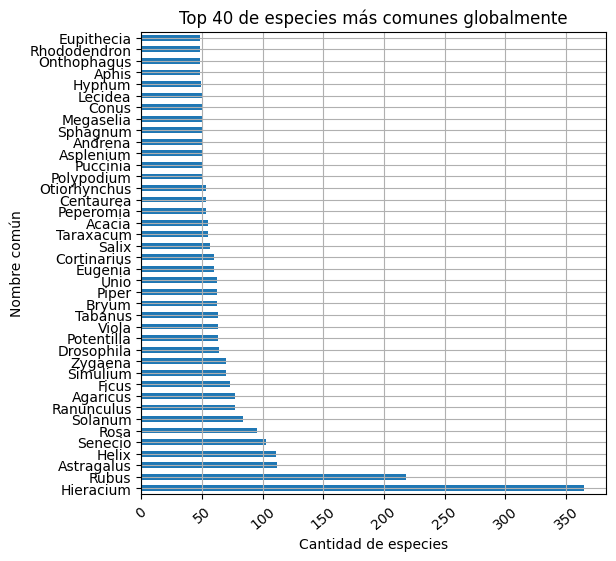

In [ ]:
taxon_counts = taxon['genericName'].value_counts()
head_taxon40 = taxon_counts.head(n=40)
tail_taxon40 = taxon_counts.tail(n= 40)

##GRAFICO TOP40
# Tamaño del gráfico
plt.figure(figsize=(6, 6)) #primera "capa de la figura"

# Crear gráfico de barras
# sepal_mean.plot(kind='bar') #grafico de barra vertical
head_taxon40.plot(kind='barh') #barh, es horizontal

# Título del gráfico
plt.title('Top 40 de especies más comunes globalmente')
# Etiqueta del eje X
plt.xlabel('Cantidad de especies')
# Etiqueta del eje Y
plt.ylabel('Nombre común')
# Inclinación de las etiquetas del eje X
#para que quepa las letras del titulo
#rota el texto
plt.xticks(rotation=40)
plt.grid()
plt.show()

# Mapas

Agregar coordenadas por pais

In [ ]:
countries_code = pd.read_csv("countries.csv")
countries_code

,Country,Alpha-2,Alpha-3,Numeric code,Latitude,Longitude
0,Afghanistan,AF,AFG,4,33.000000,65.0
1,Åland Islands,AX,ALA,248,60.116667,19.9
2,Albania,AL,ALB,8,41.000000,20.0
3,Algeria,DZ,DZA,12,28.000000,3.0
4,American Samoa,AS,ASM,16,-14.333300,-170.0
...,...,...,...,...,...,...
257,Wallis and Futuna,WF,WLF,876,-13.300000,-176.2
258,Western Sahara,EH,ESH,732,24.500000,-13.0
259,Yemen,YE,YEM,887,15.000000,48.0
260,Zambia,ZM,ZMB,894,-15.000000,30.0


In [ ]:
df_loc = df.dropna(subset=['countryCode'])#Eliminar NAs
countries_code.rename(columns={'Alpha-2': 'countryCode'}, inplace=True)#Cambiar nombre de la columna para hacer el merge
# Fusionar los DataFrames en base a la columna 'countryCode'
df_loc = pd.merge(df_loc, countries_code, on='countryCode', how='left')

In [ ]:
df_loc

,taxonID,occurrenceStatus,locationID,locality,countryCode,dcterms:source,gbif:isExtinct,gbif:isMarine,gbif:isFreshwater,gbif:isTerrestrial,...,namePublishedIn,nomenclaturalCode,nomenclaturalStatus,taxonRemarks,dcterms:references,Country,Alpha-3,Numeric code,Latitude,Longitude
0,QK5N,native,NaN,NaN,US,NaN,True,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,United States,USA,840,38.0,-97.0
1,9KSLK,native,NaN,NaN,BR,"Zanol, K.M.R. (2000a) Scaphytopius Ball (Homop...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Brazil,BRA,76,-10.0,-55.0
2,34HD8,native,NaN,NaN,AO,"Stiller, M. (2001a) The Afrotropical leafhoppe...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Angola,AGO,24,-12.5,18.5
3,34HD8,native,NaN,NaN,NG,"Stiller, M. (2001a) The Afrotropical leafhoppe...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Nigeria,NGA,566,10.0,8.0
4,34HD8,native,NaN,NaN,CG,"Stiller, M. (2001a) The Afrotropical leafhoppe...",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Congo,COG,178,-1.0,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109769,5XXLB,native,NaN,NaN,CN,NaN,False,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,China,CHN,156,35.0,105.0
109770,5XXLB,native,NaN,NaN,VN,NaN,False,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Viet Nam,VNM,704,16.0,106.0
109771,5XXLB,native,NaN,NaN,VN,NaN,False,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Vietnam,VNM,704,16.0,106.0
109772,6PKLW,native,NaN,NaN,CN,NaN,False,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,China,CHN,156,35.0,105.0


In [ ]:
df_loc['Country'].unique()#Ver informacion de la columna country

array(['United States', 'Brazil', 'Angola', 'Nigeria', 'Congo', 'Uganda',
       'Ghana', 'Madagascar', 'Australia', 'Philippines', 'Albania',
       'Gabon', 'Chile', 'Panama', 'India', 'Papua New Guinea', 'Tunisia',
       'Hungary', 'Morocco', 'Afghanistan', 'Iran, Islamic Republic of',
       'Uzbekistan', 'China', 'Belgium', 'Luxembourg', 'Netherlands',
       'Switzerland', 'Slovenia', 'Germany', 'Croatia', 'Israel',
       'Jordan', 'Kyrgyzstan', 'Greece', 'Ukraine', 'Turkmenistan',
       'Kazakhstan', 'Tajikistan', 'Iraq', 'Turkey', 'Armenia', 'Canada',
       'United Kingdom', 'Italy', 'Mexico', 'Serbia', 'Malaysia',
       'Austria', 'Japan', 'Pakistan', 'Ethiopia', 'Indonesia',
       'Thailand', 'Guatemala', 'Algeria',
       'Bolivia, Plurinational State of', 'Bolivia', 'Denmark', 'Poland',
       'Sweden', 'Czech Republic', 'Puerto Rico', 'New Zealand', 'France',
       'Guinea', 'Viet Nam', 'Vietnam', 'Nicaragua', 'Liberia', 'Ecuador',
       'Peru', 'Argentina', 'Russi

Mapa 1

In [ ]:
import plotly.express as px
import pandas as pd
# Create scatter map
fig = px.scatter_geo(df_loc, lat='Latitude ', lon='Longitude ', #color='genericName',
                     hover_name='Country', #size='mag',
                     title='Distribution Species Around the World')
fig.show()

In [ ]:
df_loc['Type'] = 'Unknown'#Crear columna llamada Type y que todas las filas digan desconocido
df_loc.loc[df['gbif:isTerrestrial'] == True, 'Type'] = 'Terrestrial'#Poner en la columna Type los que son terrestres
df_loc.loc[df['gbif:isMarine'] == True, 'Type'] = 'Marine'#Poner en la columna Type lo que son marine
df_loc.loc[df['gbif:isFreshwater'] == True, 'Type'] = 'Freshwater'#Poner en la columna los que son Freshwater
df_loc.loc[df['gbif:isExtinct'] == True, 'Type'] = 'Extinct'#Poner en la columna Type los que son Extinct

In [ ]:
df_loc['Type'].unique()#Revisar que se realizaran los cambios en la columna Type

array(['Unknown', 'Terrestrial', 'Freshwater', 'Marine', 'Extinct'],
      dtype=object)

In [ ]:
fig = px.scatter_geo(df_loc, lat='Latitude ', lon='Longitude ', color='Type',
                     hover_name='Country', #size='mag',
                     title='Distribution Species Around the World')
fig.show()

In [ ]:
df_loc.loc[df_loc['genericName'] == 'Na', 'genericName'] = 'Unknown'

In [ ]:
import plotly.express as px

fig = px.scatter_geo(df_loc, lat='Latitude ', lon='Longitude ', color='genericName',
                     hover_name='genericName', title='Distribution Species Around the World',
                     color_discrete_sequence=px.colors.qualitative.Light24) # Usando una paleta de colores más amplia

fig.show()


# Community Diversity

## Preparar la matriz de ausencia-presencia

In [ ]:
df_cleaned = df_loc.dropna(subset=['genericName', 'Country'])# Vamos a filtrar el df para quitar los Na de estas columnas de interes
df_cleaned = df_cleaned[['genericName', 'Country']]
df_cleaned

,genericName,Country
33,Euscelidius,Afghanistan
34,Euscelidius,"Iran, Islamic Republic of"
35,Euscelidius,Israel
36,Euscelidius,Jordan
37,Euscelidius,Kyrgyzstan
...,...,...
108605,Atheta,Chile
108606,Brasiliosoma,Brazil
108611,Stenus,Indonesia
108614,Emeopedus,Papua New Guinea


In [ ]:
df_cleaned['genericName'].nunique()# Contabilizar cantidad de variables diferentes en esta columna

4053

In [ ]:
df_cleaned['Country'].nunique()# Contabilizar cantidad de variables diferentes en esta columna

220

In [ ]:
taxon_countss = df_cleaned['genericName'].value_counts()#Crean un dataframe con las especies segun las veces qe aparece
head_taxon40 = taxon_countss.head(n=40)#Primeros 40
tail_taxon40 = taxon_countss.tail(n= 40)#Ultimos 40

head_taxon40

genericName
Pterolophia     301
Glenea          296
Phytoecia       237
Dorcadion       204
Prosopocera     183
Otiorhynchus    176
Demonax         166
Eunidia         165
Exocentrus      147
Agapanthia      146
Nupserha        138
Monochamus      119
Chlorophorus    113
Eupteryx        102
Oberea           98
Acalolepta       96
Sybra            95
Xylotrechus      92
Pogonocherus     87
Cortodera        87
Xystrocera       85
Rhaphuma         78
Hyllisia         76
Eburodacrys      75
Psammotettix     75
Sophronica       74
Crossotus        73
Purpuricenus     70
Pidonia          69
Oncideres        69
Tmesisternus     66
Apomecyna        65
Niphona          63
Ceresium         61
Tetropium        60
Megacyllene      56
Aegomorphus      55
Colobothea       53
Serixia          53
Lepturges        53
Name: count, dtype: int64

In [ ]:
pivoted_df = df_cleaned.pivot_table(index='Country', columns='genericName', aggfunc=len, fill_value=0)#Convertir el dataframe a una matriz de presencia ausencia

In [ ]:
pivoted_df

genericName,Abana,Abanycha,Abaraeus,Abauba,Abichites,Abimwa,Abraeomorphus,Abroma,Abryna,Acabanga,...,Zorilispe,Zorilispiella,Zorion,Zotalemimon,Zyginidia,Zygocera,Zyras,Zyrcosa,Zyrcosoides,Zyzzogeton
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Albania,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Algeria,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Andorra,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Angola,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Virgin Islands, U.S.",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Western Sahara,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Yemen,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
pivoted_df['Pterolophia'].sum()# Confirmar que el pivot longer fue exitoso, si es el caso porque anteriormente dio 301 en el top 40

301

In [ ]:
data = pivoted_df.values.tolist()# Convertir pivoted_df a una lista de listas

In [ ]:
print(data[:6])

[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [ ]:
ids = list(pivoted_df.index)#Indice del dataframe contiene los nombres de paises se convierte en una lista
ids

['Afghanistan',
 'Albania',
 'Algeria',
 'Andorra',
 'Angola',
 'Anguilla',
 'Argentina',
 'Armenia',
 'Aruba',
 'Australia',
 'Austria',
 'Azerbaijan',
 'Bahamas',
 'Bahrain',
 'Bangladesh',
 'Barbados',
 'Belarus',
 'Belgium',
 'Belize',
 'Benin',
 'Bermuda',
 'Bhutan',
 'Bolivia',
 'Bolivia, Plurinational State of',
 'Bosnia and Herzegovina',
 'Botswana',
 'Brazil',
 'Brunei',
 'Brunei Darussalam',
 'Bulgaria',
 'Burkina Faso',
 'Burma',
 'Burundi',
 'Cambodia',
 'Cameroon',
 'Canada',
 'Cape Verde',
 'Cayman Islands',
 'Central African Republic',
 'Chad',
 'Chile',
 'China',
 'Christmas Island',
 'Colombia',
 'Comoros',
 'Congo',
 'Congo, the Democratic Republic of the',
 'Costa Rica',
 'Croatia',
 'Cuba',
 'Cyprus',
 'Czech Republic',
 "Côte d'Ivoire",
 'Denmark',
 'Djibouti',
 'Dominican Republic',
 'Ecuador',
 'Egypt',
 'El Salvador',
 'Equatorial Guinea',
 'Eritrea',
 'Estonia',
 'Ethiopia',
 'Faroe Islands',
 'Fiji',
 'Finland',
 'France',
 'French Guiana',
 'French Polynesia'

##

In [ ]:
from skbio.diversity import alpha_diversity
adiv_sobs = alpha_diversity('sobs', data, ids)# Cuenta el número de especies diferentes observadas en una muestra sin tener en cuenta sus abundancias relativas
adiv_sobs

Afghanistan             20
Albania                 27
Algeria                 43
Andorra                  2
Angola                  58
                        ..
Virgin Islands, U.S.     4
Western Sahara           3
Yemen                    7
Zambia                  36
Zimbabwe                43
Length: 216, dtype: int64

In [ ]:
adiv_sobs_sorted = adiv_sobs.sort_values() #organizar por nivel de indice
# Muestra las ultimas 40 filas de la Serie ordenada
print(adiv_sobs_sorted.tail(40))


Honduras                                  98
Canada                                    98
Nicaragua                                 99
Russia                                   103
Kenya                                    103
Russian Federation                       103
Papua New Guinea                         108
Taiwan                                   110
Cameroon                                 111
Venezuela                                113
Venezuela, Bolivarian Republic of        113
Paraguay                                 119
Guatemala                                121
Madagascar                               122
Tanzania, United Republic of             132
Chile                                    134
Philippines                              136
Panama                                   142
French Guiana                            143
Japan                                    144
Lao People's Democratic Republic         146
Ecuador                                  151
Costa Rica

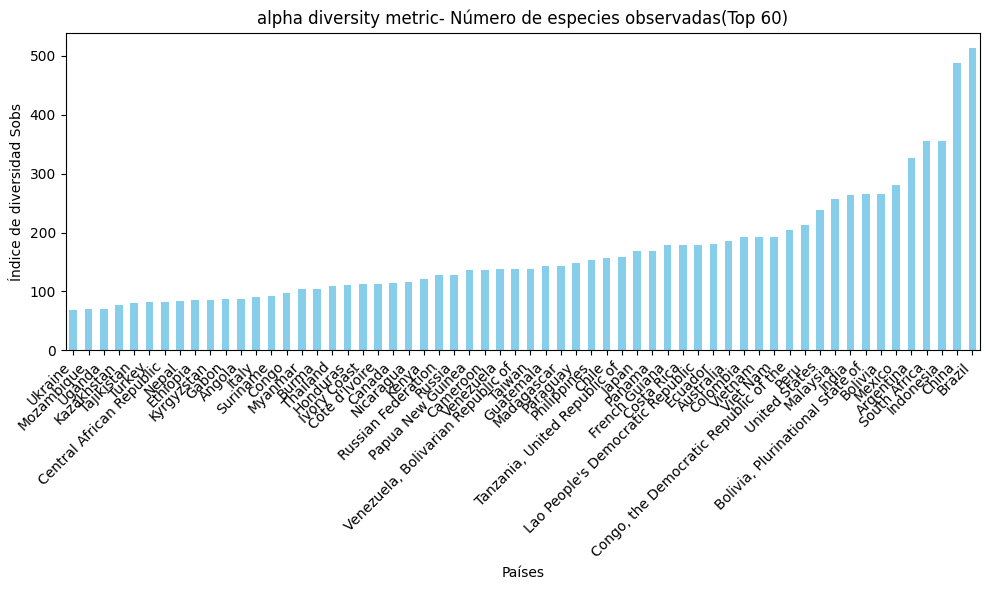

In [ ]:
plt.figure(figsize=(10, 6))
adiv_sobs_sorted.tail(60).plot(kind='bar', color='skyblue')
plt.xlabel('Países')
plt.ylabel('Índice de diversidad Sobs')
plt.title('alpha diversity metric- Número de especies observadas(Top 60)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## beta diversity metric

In [ ]:
topSob = adiv_sobs_sorted.tail(20)#Filtrar solo los primeros 20 segun su indice de diversidad alpha
indices = topSob.index#Guardar los paises que es el indice

In [ ]:
resultado = pivoted_df[pivoted_df.index.isin(indices)]
resultado

genericName,Abana,Abanycha,Abaraeus,Abauba,Abichites,Abimwa,Abroma,Abryna,Acabanga,Acacimenus,...,Zoodes,Zorilispe,Zorilispiella,Zorion,Zotalemimon,Zyginidia,Zygocera,Zyras,Zyrcosa,Zyrcosoides
Country,,,,,,,,,,,,,,,,,,,,,
Argentina,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0
Australia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
Bolivia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Bolivia, Plurinational State of",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Brazil,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
China,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
Colombia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Congo, the Democratic Republic of the",0,0,0,0,0,1,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
Costa Rica,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
data = resultado.values.tolist()# Convertir pivoted_df a una lista de listas
ids = list(resultado.index)#Guardar paises en lista

In [ ]:
from skbio.diversity import beta_diversity
bc_dm = beta_diversity("braycurtis", data, ids)#Calcular Disimilitud de Bray-Curtis

print(bc_dm)

20x20 distance matrix
IDs:
'Argentina', 'Australia', 'Bolivia', 'Bolivia, Plurinational State of', ...
Data:
[[0.         0.99074074 0.73692078 0.73692078 0.78422484 0.99644444
  0.87062937 0.99698341 0.90328152 0.89417989 0.98290598 0.99000999
  0.99347471 0.97755961 0.91020408 0.83445946 0.90189521 0.96142433
  1.         1.        ]
 [0.99074074 0.         0.99648506 0.99648506 0.99401795 0.95902439
  0.99152542 0.97513321 0.99164927 0.99571734 0.93355482 0.93118757
  0.95711501 0.94127243 0.98110236 0.99593496 0.97992472 0.97560976
  0.95530726 0.95530726]
 [0.73692078 0.99648506 0.         0.         0.54882812 0.99617591
  0.663286   0.99657534 0.728      0.65983607 0.98715891 0.9978308
  1.         1.         0.82012195 0.56335283 1.         0.9394958
  1.         1.        ]
 [0.73692078 0.99648506 0.         0.         0.54882812 0.99617591
  0.663286   0.99657534 0.728      0.65983607 0.98715891 0.9978308
  1.         1.         0.82012195 0.56335283 1.         0.9394958
  1.

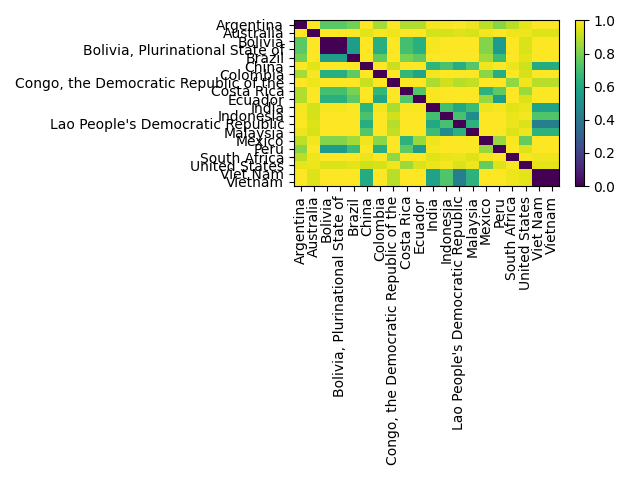

In [ ]:
bc_dm

# Análisis de correlaciones



In [ ]:
diversity = adiv_sobs.reset_index()

# Renombrando las columnas
diversity.columns = ['Country', 'Alpha_diversity']
diversity

,Country,Alpha_diversity
0,Afghanistan,20
1,Albania,27
2,Algeria,43
3,Andorra,2
4,Angola,58
...,...,...
211,"Virgin Islands, U.S.",4
212,Western Sahara,3
213,Yemen,7
214,Zambia,36


In [ ]:
div = pd.merge(diversity, countries_code, on='Country', how='left')
div

,Country,Alpha_diversity,countryCode,Alpha-3,Numeric code,Latitude,Longitude
0,Afghanistan,20,AF,AFG,4,33.0000,65.0000
1,Albania,27,AL,ALB,8,41.0000,20.0000
2,Algeria,43,DZ,DZA,12,28.0000,3.0000
3,Andorra,2,AD,AND,20,42.5000,1.6000
4,Angola,58,AO,AGO,24,-12.5000,18.5000
...,...,...,...,...,...,...,...
211,"Virgin Islands, U.S.",4,VI,VIR,850,18.3333,-64.8333
212,Western Sahara,3,EH,ESH,732,24.5000,-13.0000
213,Yemen,7,YE,YEM,887,15.0000,48.0000
214,Zambia,36,ZM,ZMB,894,-15.0000,30.0000


In [ ]:
PIB = pd.read_csv("PIB.csv")#Agregar dataframe con datos del PIB 2021 de paises
PIB

,Countryname,Alpha-3,2021
0,Aruba,ABW,29127.759384
1,Africa Eastern and Southern,AFE,1545.613215
2,Afghanistan,AFG,355.777826
3,Africa Western and Central,AFW,1766.943618
4,Angola,AGO,1927.474078
...,...,...,...
251,Kosovo,XKX,5269.783901
252,"Yemen, Rep.",YEM,543.637538
253,South Africa,ZAF,7073.612754
254,Zambia,ZMB,1134.713454


In [ ]:
div = pd.merge(div, PIB, on='Alpha-3', how='left')#Agregar columna del PIB al dataframe div
div

,Country,Alpha_diversity,countryCode,Alpha-3,Numeric code,Latitude,Longitude,Countryname,2021
0,Afghanistan,20,AF,AFG,4,33.0000,65.0000,Afghanistan,355.777826
1,Albania,27,AL,ALB,8,41.0000,20.0000,Albania,6377.203096
2,Algeria,43,DZ,DZA,12,28.0000,3.0000,Algeria,3700.314697
3,Andorra,2,AD,AND,20,42.5000,1.6000,Andorra,42072.319423
4,Angola,58,AO,AGO,24,-12.5000,18.5000,Angola,1927.474078
...,...,...,...,...,...,...,...,...,...
211,"Virgin Islands, U.S.",4,VI,VIR,850,18.3333,-64.8333,Virgin Islands (U.S.),41976.008312
212,Western Sahara,3,EH,ESH,732,24.5000,-13.0000,NaN,NaN
213,Yemen,7,YE,YEM,887,15.0000,48.0000,"Yemen, Rep.",543.637538
214,Zambia,36,ZM,ZMB,894,-15.0000,30.0000,Zambia,1134.713454


In [ ]:
div = div.set_index('Country')# Convertir Country en indice

In [ ]:
columnas_a_eliminar = ['countryCode', 'Alpha-3', 'Numeric code', 'Countryname']

# Eliminar las columnas
div = div.drop(columnas_a_eliminar, axis=1)
div = div.dropna()
div

,Alpha_diversity,Latitude,Longitude,2021,count
Country,,,,,
Afghanistan,20,33.0000,65.0000,355.777826,191
Albania,27,41.0000,20.0000,6377.203096,347
Algeria,43,28.0000,3.0000,3700.314697,439
Andorra,2,42.5000,1.6000,42072.319423,20
Angola,58,-12.5000,18.5000,1927.474078,460
...,...,...,...,...,...
Vietnam,160,16.0000,106.0000,3756.488901,1422
"Virgin Islands, U.S.",4,18.3333,-64.8333,41976.008312,33
Yemen,7,15.0000,48.0000,543.637538,75


In [ ]:
div = div.dropna()#Quitar NAs
div

,Alpha_diversity,Latitude,Longitude,2021
Country,,,,
Afghanistan,20,33.0000,65.0000,355.777826
Albania,27,41.0000,20.0000,6377.203096
Algeria,43,28.0000,3.0000,3700.314697
Andorra,2,42.5000,1.6000,42072.319423
Angola,58,-12.5000,18.5000,1927.474078
...,...,...,...,...
Vietnam,160,16.0000,106.0000,3756.488901
"Virgin Islands, U.S.",4,18.3333,-64.8333,41976.008312
Yemen,7,15.0000,48.0000,543.637538


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

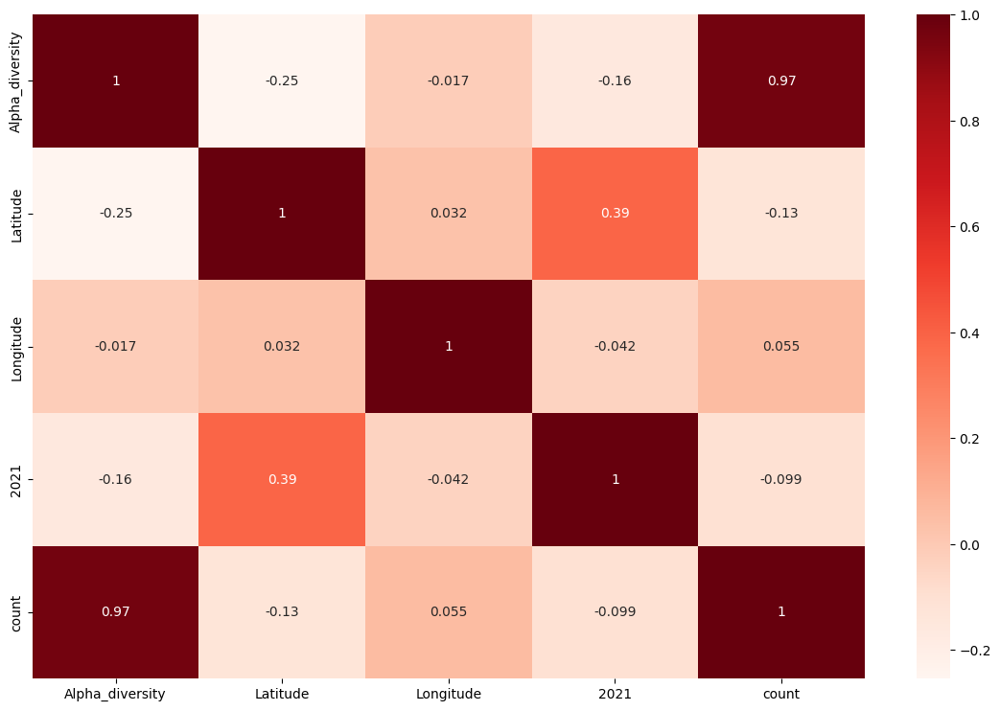

In [ ]:
matrix=div.corr()# Correlación de pearson entre variables de div
plt.figure(figsize=(14,9))
sns.heatmap(matrix,cmap='Reds',annot=True)
plt.show()

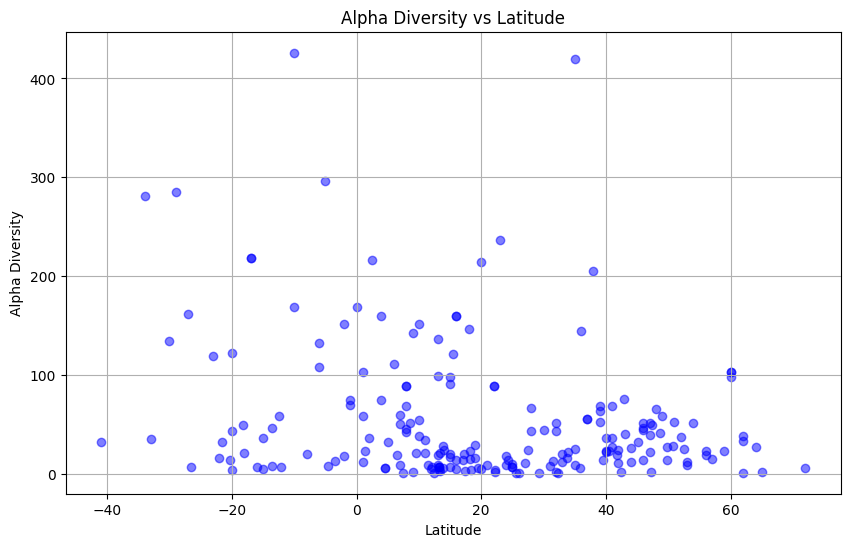

In [ ]:
# Grafico comparando Latitud vs Diversidad Alpha
plt.figure(figsize=(10, 6))
plt.scatter(div['Latitude'], div['Alpha_diversity'], color='blue', alpha=0.5)
plt.title('Alpha Diversity vs Latitude')
plt.xlabel('Latitude')
plt.ylabel('Alpha Diversity')
plt.grid(True)
plt.show()

In [ ]:
div = pd.merge(div, locality_counts, on='Country', how='left')# Agregar columna counts a div
div


,Country,Alpha_diversity,countryCode,Alpha-3,Numeric code,Latitude,Longitude,Countryname,2021,count
0,Afghanistan,20,AF,AFG,4,33.0000,65.0000,Afghanistan,355.777826,191
1,Albania,27,AL,ALB,8,41.0000,20.0000,Albania,6377.203096,347
2,Algeria,43,DZ,DZA,12,28.0000,3.0000,Algeria,3700.314697,439
3,Andorra,2,AD,AND,20,42.5000,1.6000,Andorra,42072.319423,20
4,Angola,58,AO,AGO,24,-12.5000,18.5000,Angola,1927.474078,460
...,...,...,...,...,...,...,...,...,...,...
211,"Virgin Islands, U.S.",4,VI,VIR,850,18.3333,-64.8333,Virgin Islands (U.S.),41976.008312,33
212,Western Sahara,3,EH,ESH,732,24.5000,-13.0000,NaN,NaN,9
213,Yemen,7,YE,YEM,887,15.0000,48.0000,"Yemen, Rep.",543.637538,75
214,Zambia,36,ZM,ZMB,894,-15.0000,30.0000,Zambia,1134.713454,287


# Descripción de resultados

*   Se generaron análisis exploratorios para los dataframe importados, correspondientes a Taxon, Distribución y Especies. Esto permitió indentificar el set de datos en cada DF (eg. cantidad de datos nulos, faltantes, desbalances, repetidos, tendencias, máximos, mínimos).

*   Se obtuvieron métricas generales de los dataframe empleando comandos vistos en clase como shape, unique, etc

*   Se unificaron estos tres DF para trabajar con un archivo consolidado y se graficaron el top 40 y tail 40 de los países con más y menos especies reportadas.

*  Se generaron mapas de distribución geográfica para las especies reportadas, según categoría (marina, terrestre, desconocida, etc) y para las especies más representativas.



# Conclusiones generales

1.   El catálogo de la vida tiene un alto componente de datos faltantes o desconocidos; lo que evidencia el vacío de información existente en varios grupos taxonómicos.
2.   Los países con mayor concentración de reportes el el catálogo de la vida, no necesariamente alinean con los de mayor diversidad biológica y Costa Rica si figura entre el top 40.
3.   La mayor representación de especies se concentra en las plantas, lo que evidencia de forma urgente la necesidad de cubrir otros grupos taxonómicos con el fúngico.
4.   La categoría de agual dulce posee pocos registros a nivel global y de forma interesante Cuba, Haití, Puerto Rico, Jamaica e islas aledañas reportan la mayor cantidad de especies bajo la categoría "desconocida".





# Referencias
1. Pacyga, K., Pacyga, P., Topola, E., Viscardi, S., & Duda-Madej, A. (2024). Bioactive Compounds from Plant Origin as Natural Antimicrobial Agents for the Treatment of Wound Infections. International journal of molecular sciences, 25(4), 2100. https://doi.org/10.3390/ijms25042100

2. Rogers AD, Appeltans W, Assis J, Ballance LT, Cury P, Duarte C, Favoretto F, Hynes LA, Kumagai JA, Lovelock CE, Miloslavich P, Niamir A, Obura D, O'Leary BC, Ramirez-Llodra E, Reygondeau G, Roberts C, Sadovy Y, Steeds O, Sutton T, Tittensor DP, Velarde E, Woodall L, Aburto-Oropeza O. Discovering marine biodiversity in the 21st century. Adv Mar Biol. 2022;93:23-115. doi: 10.1016/bs.amb.2022.09.002. Epub 2022 Nov 7. PMID: 36435592.

3. Folk, R. A., & Siniscalchi, C. M. (2021). Biodiversity at the global scale: the synthesis continues. American journal of botany, 108(6), 912–924. https://doi.org/10.1002/ajb2.1694

4. Bills, G. F., & Gloer, J. B. (2016). Biologically Active Secondary Metabolites from the Fungi. Microbiology spectrum, 4(6), 10.1128/microbiolspec.FUNK-0009-2016. https://doi.org/10.1128/microbiolspec.FUNK-0009-2016

5. Kirk, P. (2023). Species Fungorum Plus. In O. Bánki, Y. Roskov, M. Döring, G. Ower, D. R. Hernández Robles, C. A. Plata Corredor, T. Stjernegaard Jeppesen, A. Örn, L. Vandepitte, D. Hobern, P. Schalk, R. E. DeWalt, K. Ma, J. Miller, T. Orrell, R. Aalbu, J. Abbott, R. Adlard, C. Aedo, et al., Catalogue of Life Checklist (Jan 2023). Royal Botanic Gardens, Kew. https://doi.org/10.48580/dfrdl-4hj

6. Alexander, S., Hodson, A., Mitchell, D., Nicolson, D., Orrell, T., & Perez-Gelabert, D. (2024). The Integrated Taxonomic Information System. In O. Bánki, Y. Roskov, M. Döring, G. Ower, D. R. Hernández Robles, C. A. Plata Corredor, T. Stjernegaard Jeppesen, A. Örn, L. Vandepitte, D. Hobern, P. Schalk, R. E. DeWalt, K. Ma, J. Miller, T. Orrell, R. Aalbu, J. Abbott, R. Adlard, C. Aedo, et al., Catalogue of Life Checklist (Version 2024-02-28). ITIS. https://doi.org/10.48580/dfz6w-4ky
